# Visualization - Inference

In [52]:
import scanpy as sc
import pandas as pd
import numpy as np
import scgpt 
from scgpt.preprocess import Preprocessor
from scgpt.model import TransformerModel
from scgpt.tokenizer.gene_tokenizer import GeneVocab
import torch
import json

from scgpt.tokenizer import tokenize_and_pad_batch
import numpy as np

import torch
from torch.utils.data import DataLoader, Dataset
import pandas as pd
import scvi
import obonet
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib as mpl


## Flu Visualization

## COVID Visualization

In [62]:
covid_data_preds = sc.read_h5ad("../data/inference/covid_all_czi_preds.h5ad")

In [68]:
len(covid_data_preds.obs.predicted_celltype.unique())

75

In [69]:
coarse_map = {
    # Monocytes
    "classical monocyte": "CD14+ monocyte",
    "CD14-positive monocyte": "CD14+ monocyte",
    "CD14-positive, CD16-negative classical monocyte": "CD14+ monocyte",
    "intermediate monocyte": "Intermediate monocyte",
    "CD14-positive, CD16-positive monocyte": "Intermediate monocyte",
    "non-classical monocyte": "CD16+ monocyte",
    "CD14-low, CD16-positive monocyte": "CD16+ monocyte",
    "monocyte": "Unspecified monocyte",

    # CD8+ T cells
    "CD8-positive, alpha-beta T cell": "CD8+ T cell",
    "effector CD8-positive, alpha-beta T cell": "CD8+ T cell",
    "effector memory CD8-positive, alpha-beta T cell": "CD8+ T cell",
    "activated CD8-positive, alpha-beta T cell, human": "CD8+ T cell",
    "naive thymus-derived CD8-positive, alpha-beta T cell": "CD8+ T cell",
    "CD8-positive, alpha-beta memory T cell": "CD8+ T cell",
    "CD8-positive, alpha-beta cytotoxic T cell": "CD8+ T cell",
    "effector memory CD8-positive, alpha-beta T cell, terminally differentiated": "CD8+ T cell",

    # CD4+ T cells
    "CD4-positive, alpha-beta T cell": "CD4+ T cell",
    "CD4-positive, alpha-beta memory T cell": "CD4+ T cell",
    "CD4-positive, alpha-beta cytotoxic T cell": "CD4+ T cell",
    "CD4-positive helper T cell": "CD4+ T cell",
    "central memory CD4-positive, alpha-beta T cell": "CD4+ T cell",
    "naive thymus-derived CD4-positive, alpha-beta T cell": "CD4+ T cell",
    "activated CD4-positive, alpha-beta T cell, human": "CD4+ T cell",
    "effector CD4-positive, alpha-beta T cell": "CD4+ T cell",
    "effector memory CD4-positive, alpha-beta T cell": "CD4+ T cell",
    "T-helper 1 cell": "CD4+ T cell",
    "T-helper 22 cell": "CD4+ T cell",
    "T follicular helper cell": "CD4+ T cell",
    "naive T cell": "CD4+ T cell",
    "double negative T regulatory cell": "CD4+ T cell",
    "double-positive, alpha-beta thymocyte": "T cell precursor",
    "double negative thymocyte": "T cell precursor",

    # Regulatory / other T cells
    "regulatory T cell": "Regulatory T cell",
    "T cell": "Unspecified T cell",
    "alpha-beta T cell": "Unspecified T cell",
    "mature alpha-beta T cell": "Unspecified T cell",
    "memory T cell": "Unspecified T cell",

    # Gamma-delta / MAIT / NKT
    "gamma-delta T cell": "Gamma-delta T cell",
    "mature gamma-delta T cell": "Gamma-delta T cell",
    "mucosal invariant T cell": "MAIT cell",
    "mature NK T cell": "NKT cell",

    # NK cells
    "natural killer cell": "NK cell",
    "CD16-negative, CD56-bright natural killer cell, human": "NK cell",
    "CD16-positive, CD56-dim natural killer cell, human": "NK cell",

    # B cells
    "B cell": "Unspecified B cell",
    "naive B cell": "Naive B cell",
    "transitional stage B cell": "Naive B cell",
    "immature B cell": "Naive B cell",
    "memory B cell": "Memory B cell",
    "unswitched memory B cell": "Memory B cell",
    "IgG memory B cell": "Memory B cell",
    "class switched memory B cell": "Memory B cell",
    "CD38-negative naive B cell": "Naive B cell",
    "B-2 B cell": "Naive B cell",

    # Plasma cells
    "plasma cell": "Plasma cell",
    "plasmablast": "Plasma cell",
    "IgG plasmablast": "Plasma cell",
    "IgA plasmablast": "Plasma cell",
    "IgA plasma cell": "Plasma cell",
    "IgG plasma cell": "Plasma cell",
    "IgM plasma cell": "Plasma cell",

    # Dendritic cells
    "dendritic cell": "Dendritic cell",
    "dendritic cell, human": "Dendritic cell",
    "conventional dendritic cell": "Dendritic cell",
    "plasmacytoid dendritic cell": "Dendritic cell",
    "plasmacytoid dendritic cell, human": "Dendritic cell",
    "myeloid dendritic cell": "Dendritic cell",

    # Neutrophils
    "neutrophil": "Neutrophil",
    "immature neutrophil": "Neutrophil",

    # Myeloid
    "myeloid cell": "Unspecified myeloid",
    "macrophage": "Myeloid cell",

    # Erythroid
    "erythrocyte": "Erythrocyte",
    "enucleated reticulocyte": "Erythrocyte",
    "erythroid progenitor cell, mammalian": "Erythroid progenitor",

    # Platelet / Megakaryocyte
    "platelet": "Platelet",
    "megakaryocyte": "Megakaryocyte",
    "megakaryocyte-erythroid progenitor cell": "MEP",

    # Stem / Progenitor
    "hematopoietic stem cell": "Hematopoietic stem cell",
    "CD34-positive, CD38-negative hematopoietic stem cell": "Hematopoietic stem cell",
    "hematopoietic precursor cell": "Hematopoietic stem cell",
    "stem cell": "Stem cell",
    "progenitor cell": "Progenitor cell",
    "myeloid lineage restricted progenitor cell": "Progenitor cell",

    # Lymphoid (unspecified)
    "lymphocyte": "Unspecified lymphoid",
    "innate lymphoid cell": "ILC",
    "ILC1, human": "ILC",
    "group 2 innate lymphoid cell, human": "ILC",

    # Misc
    "blood cell": "Unspecified blood cell",
    "granulocyte": "Granulocyte",
    "malignant cell": "Malignant cell",
    "unknown": "Unknown",
    "mast cell": "Mast cell"
}

# Map true labels to coarse classes
covid_data_preds.obs["true_coarse"] = covid_data_preds.obs["cell_type"].map(coarse_map).fillna("unmapped")
len(covid_data_preds.obs.true_coarse.unique())
# Map predicted labels to coarse classes
covid_data_preds.obs["pred_coarse"] = covid_data_preds.obs["predicted_celltype"].map(coarse_map).fillna("unmapped")
len(covid_data_preds.obs.pred_coarse.unique())

33

In [70]:
# Get unique labels from both columns
all_labels = pd.Index(covid_data_preds.obs["true_coarse"].unique()).union(covid_data_preds.obs["pred_coarse"].unique())

# Grouping by biological class
monocyte_ct = [ct for ct in all_labels if "monocyte" in ct.lower()]
t_cell_ct = [ct for ct in all_labels if "t cell" in ct.lower()]
b_cell_ct = [ct for ct in all_labels if "b cell" in ct.lower()]
nk_cell_ct = [ct for ct in all_labels if "nk" in ct.lower()]
dc_ct = [ct for ct in all_labels if "dendritic" in ct.lower()]
platelet_ct = [ct for ct in all_labels if "platelet" in ct.lower() or "megakaryocyte" in ct.lower()]
erythro_ct = [ct for ct in all_labels if "erythro" in ct.lower()]
stem_ct = [ct for ct in all_labels if "stem" in ct.lower()]
other_ct = [ct for ct in all_labels if ct not in monocyte_ct + t_cell_ct + b_cell_ct + nk_cell_ct + dc_ct + platelet_ct + erythro_ct + stem_ct]

# Assign color palettes
palette = {}
palette.update(dict(zip(monocyte_ct, sns.color_palette("dark:salmon_r", len(monocyte_ct)))))
palette.update(dict(zip(t_cell_ct, sns.color_palette("RdPu", len(t_cell_ct)))))
palette.update(dict(zip(b_cell_ct, sns.color_palette("YlGn", len(b_cell_ct)))))
palette.update(dict(zip(nk_cell_ct, sns.color_palette("BuPu", len(nk_cell_ct)))))
palette.update(dict(zip(dc_ct, sns.color_palette("YlOrBr", len(dc_ct)))))
palette.update(dict(zip(platelet_ct, sns.color_palette("cividis", len(platelet_ct)))))
palette.update(dict(zip(erythro_ct, sns.color_palette("flare", len(erythro_ct)))))
palette.update(dict(zip(stem_ct, sns.color_palette("crest", len(stem_ct)))))
palette.update(dict(zip(other_ct, sns.color_palette("BrBG", len(other_ct)))))

In [71]:
# Optional: high-res settings
sc.set_figure_params(
    dpi=150,
    dpi_save=150,
    fontsize=12,
    figsize=(6, 6),
    frameon=False,
    vector_friendly=True,
    format='png'
)

/home/s5srinivasan/py39env/lib64/python3.9/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [72]:
# Extract scGPT embedding coordinates
x = covid_data_preds.obsm["X_scgpt"][:, 0]
y = covid_data_preds.obsm["X_scgpt"][:, 1]

# Set same axis limits for both plots
xlim = (x.min() - 1, x.max() + 1)
ylim = (y.min() - 1, y.max() + 1)

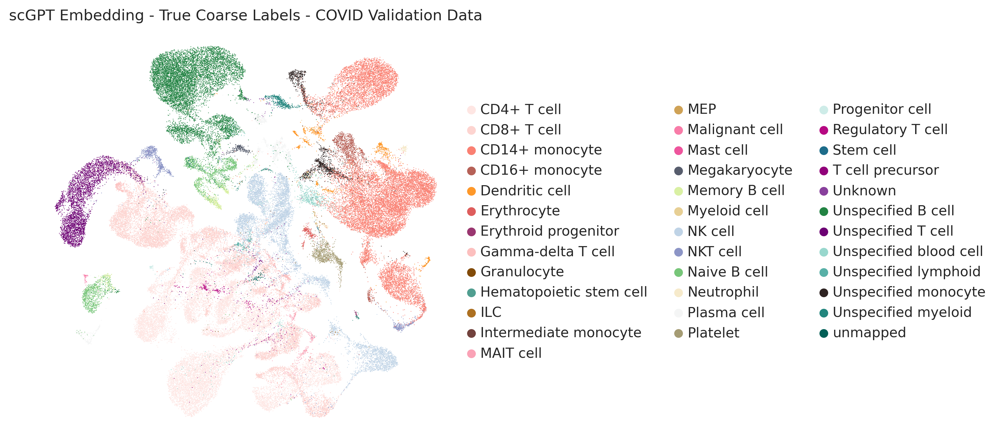

In [73]:
# Plot true labels
sc.pl.embedding(
    covid_data_preds,
    basis="umap_scgpt",
    color="true_coarse",
    palette=palette,
    legend_loc="right margin",
    title="scGPT Embedding - True Coarse Labels - COVID Validation Data",
    frameon=False,
)
plt.xlim(xlim)
plt.ylim(ylim)
# plt.savefig("scgpt_embedding_true_coarse_fixed.png", dpi=300, bbox_inches='tight')
plt.close()

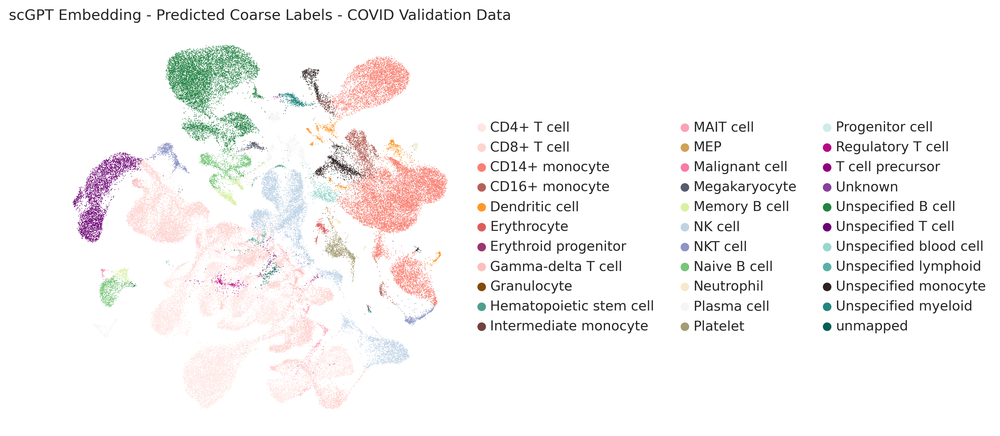

In [ ]:
# Plot true labels
sc.pl.embedding(
    covid_data_preds,
    basis="umap_scgpt",
    color="pred_coarse",
    palette=palette,
    legend_loc="right margin",
    title="scGPT Embedding - Predicted Coarse Labels - COVID Validation Data",
    frameon=False,
)
plt.xlim(xlim)
plt.ylim(ylim)
# plt.savefig("scgpt_embedding_true_coarse_fixed.png", dpi=300, bbox_inches='tight')
plt.close()

In [86]:
covid_data_preds

AnnData object with n_obs × n_vars = 81802 × 61891
    obs: 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'batch', 'predictions', 'predicted_celltype', 'leiden_scgpt', 'true_coarse', 'pred_coarse'
    var: 'soma_joinid', 'feature_id', 'feature_name', 'feature_type', 'feature_length', 'nnz', 'n_measured_obs'
    uns: 'cell_type_colors', 'dataset_id_colors', 'leiden_scgpt', 'neighbors', 'pca', 'umap', 'true_coarse_colors', 'pred_coarse_colors'
    obsm: 'X_pca', 'X_pca_umap', 'X_scgpt', 'X_umap', 'X_u

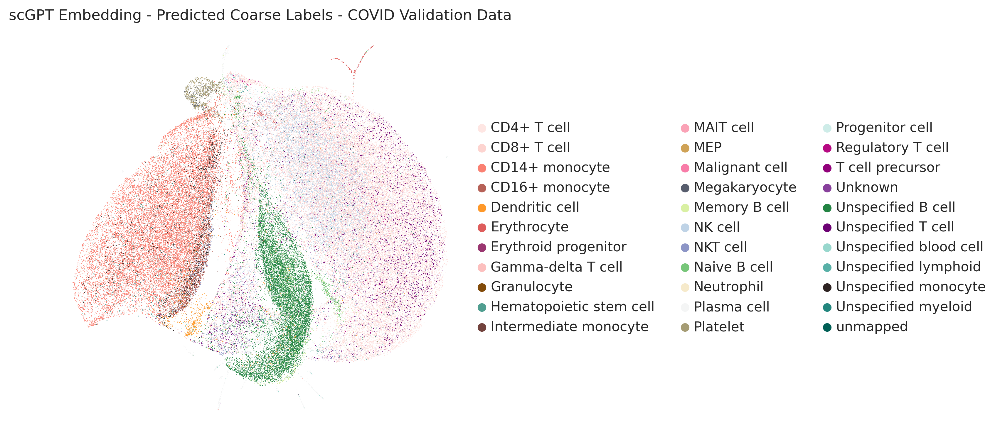

In [87]:
# Plot true labels
sc.pl.embedding(
    covid_data_preds,
    basis="pca_umap",
    color="pred_coarse",
    palette=palette,
    legend_loc="right margin",
    title="scGPT Embedding - Predicted Coarse Labels - COVID Validation Data",
    frameon=False,
)
plt.xlim(xlim)
plt.ylim(ylim)
# plt.savefig("scgpt_embedding_true_coarse_fixed.png", dpi=300, bbox_inches='tight')
plt.close()

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Compute raw confusion matrix
cm = pd.crosstab(
    covid_data_preds.obs["true_coarse"],
    covid_data_preds.obs["pred_coarse"],
    rownames=["True Cell Type"],
    colnames=["Predicted Cell Type"],
    dropna=False
)

# Reorder columns to match the true label order
true_order = cm.index.tolist()
column_order = [col for col in true_order if col in cm.columns] + [col for col in cm.columns if col not in true_order]
cm = cm[column_order]

# Normalize row-wise to get percentages
cm_percent = cm.div(cm.sum(axis=1), axis=0) * 100

# Plot confusion matrix
plt.figure(figsize=(30, 20), dpi=300)
sns.set(style="whitegrid")

ax = sns.heatmap(
    cm_percent,
    cmap="YlGnBu",
    annot=True,
    fmt=".1f",
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar_kws={'label': 'Percentage (%)'},
    annot_kws={"fontsize": 12}
)

# Titles and labels
ax.set_title("Confusion Matrix (in %) – scGPT Predicted vs True Coarse Cell Types - Influenza Validation Data", fontsize=16, pad=20)
ax.set_xlabel("Predicted Cell Type", fontsize=14, labelpad=10)
ax.set_ylabel("True Cell Type", fontsize=14, labelpad=10)

# Tick formatting
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=9)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=9)

plt.tight_layout()
plt.savefig("confusion_matrix_scgpt_coarse_aligned.png", dpi=300, bbox_inches="tight")
plt.show()

In [53]:
flu_data_preds = sc.read_h5ad("../data/inference/influenza_lee_czi_preds.h5ad")

In [54]:
true_label_coarse_map = {
    "classical monocyte": "CD14+ monocyte",
    "non-classical monocyte": "CD16+ monocyte",
    "intermediate monocyte": "Intermediate monocyte",

    "CD8-positive, alpha-beta T cell": "CD8+ T cell",
    "effector CD8-positive, alpha-beta T cell": "CD8+ T cell",

    "CD4-positive helper T cell": "CD4+ T cell",
    "effector CD4-positive, alpha-beta T cell": "CD4+ T cell",

    "natural killer cell": "NK cell",

    "IgG-negative class switched memory B cell": "Memory B cell",
    "IgG memory B cell": "Memory B cell",

    "dendritic cell": "Dendritic cell",

    "erythrocyte": "Erythrocyte",
    "platelet": "Platelet",

    "blood cell": "Unspecified blood cell"
}

pred_label_coarse_map = {
    # Monocytes
    "classical monocyte": "CD14+ monocyte",
    "CD14-positive monocyte": "CD14+ monocyte",
    "CD14-positive, CD16-negative classical monocyte": "CD14+ monocyte",
    "CD14-positive, CD16-positive monocyte": "Intermediate monocyte",
    "non-classical monocyte": "CD16+ monocyte",
    "CD14-low, CD16-positive monocyte": "CD16+ monocyte",
    "monocyte": "Unspecified monocyte",
    
    # CD8+ T cells
    "CD8-positive, alpha-beta T cell": "CD8+ T cell",
    "effector CD8-positive, alpha-beta T cell": "CD8+ T cell",
    "effector memory CD8-positive, alpha-beta T cell": "CD8+ T cell",
    "activated CD8-positive, alpha-beta T cell, human": "CD8+ T cell",
    "naive thymus-derived CD8-positive, alpha-beta T cell": "CD8+ T cell",

    # CD4+ T cells
    "central memory CD4-positive, alpha-beta T cell": "CD4+ T cell",
    "CD4-positive, alpha-beta T cell": "CD4+ T cell",
    "CD4-positive, alpha-beta memory T cell": "CD4+ T cell",
    "naive thymus-derived CD4-positive, alpha-beta T cell": "CD4+ T cell",
    "activated CD4-positive, alpha-beta T cell, human": "CD4+ T cell",
    "CD4-positive, alpha-beta cytotoxic T cell": "CD4+ T cell",
    "regulatory T cell": "Regulatory T cell",
    "T cell": "Unspecified T cell",
    "mature alpha-beta T cell": "Unspecified T cell",

    # Gamma-delta / MAIT / NKT
    "gamma-delta T cell": "Gamma-delta T cell",
    "mucosal invariant T cell": "MAIT cell",
    "mature NK T cell": "NKT cell",

    # NK cells
    "natural killer cell": "NK cell",
    "CD16-negative, CD56-bright natural killer cell, human": "NK cell",
    "CD16-positive, CD56-dim natural killer cell, human": "NK cell",

    # B cells
    "naive B cell": "Naive B cell",
    "memory B cell": "Memory B cell",
    "transitional stage B cell": "Naive B cell",
    "B cell": "Unspecified B cell",

    # Plasma cells / Plasmablasts
    "plasmablast": "Plasma cell",
    "IgG plasmablast": "Plasma cell",
    "IgA plasmablast": "Plasma cell",

    # Dendritic cells
    "conventional dendritic cell": "Dendritic cell",
    "plasmacytoid dendritic cell, human": "Dendritic cell",
    "dendritic cell": "Dendritic cell",

    # Neutrophils
    "neutrophil": "Neutrophil",
    "immature neutrophil": "Neutrophil",

    # Other cell types
    "erythrocyte": "Erythrocyte",
    "platelet": "Platelet",
    "megakaryocyte": "Megakaryocyte",
    "megakaryocyte-erythroid progenitor cell": "MEP",
    "hematopoietic stem cell": "Hematopoietic stem cell",
    "CD34-positive, CD38-negative hematopoietic stem cell": "Hematopoietic stem cell",
    "myeloid cell": "Unspecified myeloid",
    "lymphocyte": "Unspecified lymphoid",
    "blood cell": "Unspecified blood cell",
}

# Map true labels to coarse classes
flu_data_preds.obs["true_coarse"] = flu_data_preds.obs["cell_type"].map(true_label_coarse_map).fillna("unmapped")
len(flu_data_preds.obs.true_coarse.unique())
# Map predicted labels to coarse classes
flu_data_preds.obs["pred_coarse"] = flu_data_preds.obs["predicted_celltype"].map(pred_label_coarse_map).fillna("unmapped")
len(flu_data_preds.obs.pred_coarse.unique())

26

In [55]:
# Get unique labels from both columns
all_labels = pd.Index(flu_data_preds.obs["true_coarse"].unique()).union(flu_data_preds.obs["pred_coarse"].unique())

# Grouping by biological class
monocyte_ct = [ct for ct in all_labels if "monocyte" in ct.lower()]
t_cell_ct = [ct for ct in all_labels if "t cell" in ct.lower()]
b_cell_ct = [ct for ct in all_labels if "b cell" in ct.lower()]
nk_cell_ct = [ct for ct in all_labels if "nk" in ct.lower()]
dc_ct = [ct for ct in all_labels if "dendritic" in ct.lower()]
platelet_ct = [ct for ct in all_labels if "platelet" in ct.lower() or "megakaryocyte" in ct.lower()]
erythro_ct = [ct for ct in all_labels if "erythro" in ct.lower()]
stem_ct = [ct for ct in all_labels if "stem" in ct.lower()]
other_ct = [ct for ct in all_labels if ct not in monocyte_ct + t_cell_ct + b_cell_ct + nk_cell_ct + dc_ct + platelet_ct + erythro_ct + stem_ct]

# Assign color palettes
palette = {}
palette.update(dict(zip(monocyte_ct, sns.color_palette("dark:salmon_r", len(monocyte_ct)))))
palette.update(dict(zip(t_cell_ct, sns.color_palette("RdPu", len(t_cell_ct)))))
palette.update(dict(zip(b_cell_ct, sns.color_palette("YlGn", len(b_cell_ct)))))
palette.update(dict(zip(nk_cell_ct, sns.color_palette("BuPu", len(nk_cell_ct)))))
palette.update(dict(zip(dc_ct, sns.color_palette("YlOrBr", len(dc_ct)))))
palette.update(dict(zip(platelet_ct, sns.color_palette("cividis", len(platelet_ct)))))
palette.update(dict(zip(erythro_ct, sns.color_palette("flare", len(erythro_ct)))))
palette.update(dict(zip(stem_ct, sns.color_palette("crest", len(stem_ct)))))
palette.update(dict(zip(other_ct, sns.color_palette("BrBG", len(other_ct)))))

In [56]:
# Optional: high-res settings
sc.set_figure_params(
    dpi=150,
    dpi_save=150,
    fontsize=12,
    figsize=(6, 6),
    frameon=False,
    vector_friendly=True,
    format='png'
)

/home/s5srinivasan/py39env/lib64/python3.9/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [57]:
# Extract scGPT embedding coordinates
x = flu_data_preds.obsm["X_scgpt"][:, 0]
y = flu_data_preds.obsm["X_scgpt"][:, 1]

# Set same axis limits for both plots
xlim = (x.min() - 1, x.max() + 1)
ylim = (y.min() - 1, y.max() + 1)

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

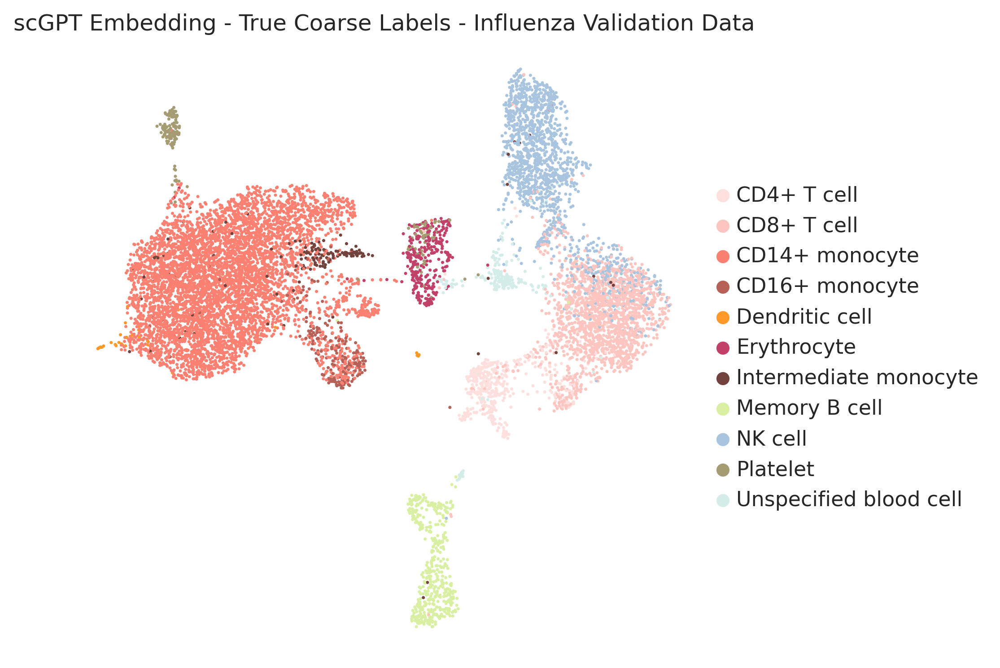

In [58]:
# Plot true labels
sc.pl.embedding(
    flu_data_preds,
    basis="umap_scgpt",
    color="true_coarse",
    palette=palette,
    legend_loc="right margin",
    title="scGPT Embedding - True Coarse Labels - Influenza Validation Data",
    frameon=False,
)
plt.xlim(xlim)
plt.ylim(ylim)
# plt.savefig("scgpt_embedding_true_coarse_fixed.png", dpi=300, bbox_inches='tight')
plt.close()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

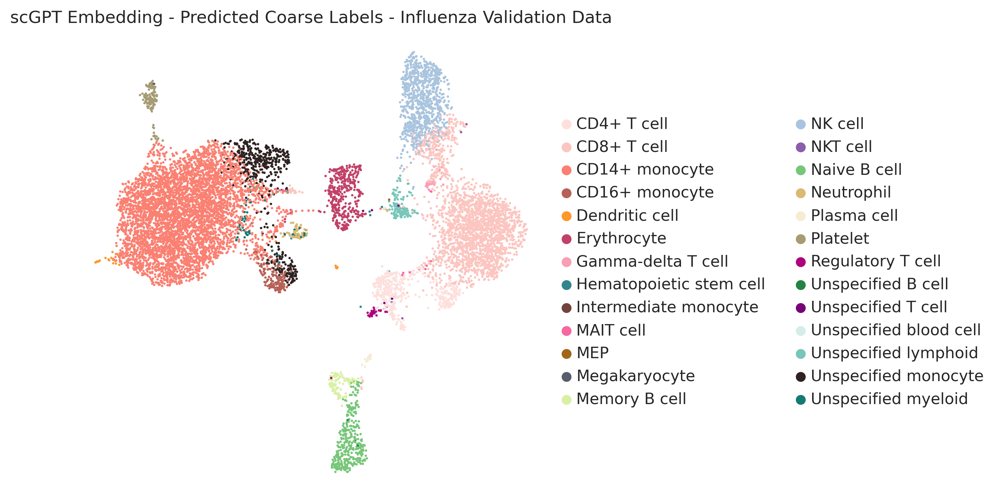

In [59]:
# Plot true labels
sc.pl.embedding(
    flu_data_preds,
    basis="umap_scgpt",
    color="pred_coarse",
    palette=palette,
    legend_loc="right margin",
    title="scGPT Embedding - Predicted Coarse Labels - Influenza Validation Data",
    frameon=False,
)
plt.xlim(xlim)
plt.ylim(ylim)
# plt.savefig("scgpt_embedding_true_coarse_fixed.png", dpi=300, bbox_inches='tight')
plt.close()

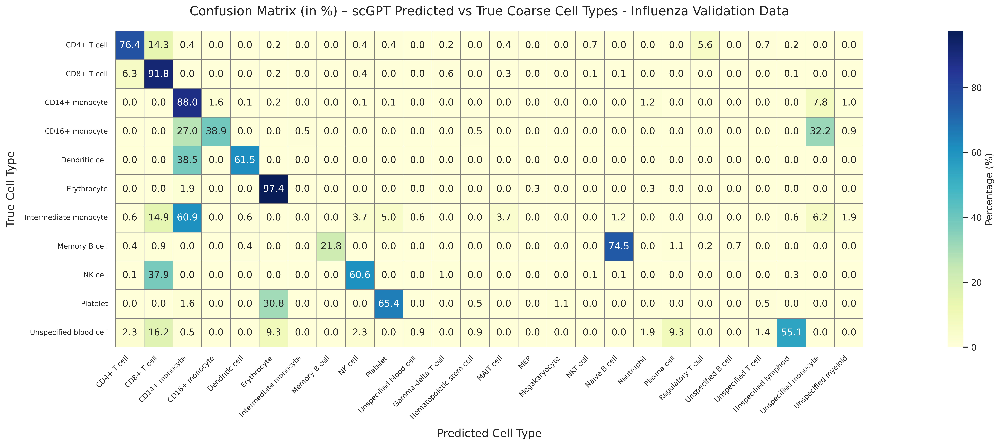

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Compute raw confusion matrix
cm = pd.crosstab(
    flu_data_preds.obs["true_coarse"],
    flu_data_preds.obs["pred_coarse"],
    rownames=["True Cell Type"],
    colnames=["Predicted Cell Type"],
    dropna=False
)

# Reorder columns to match the true label order
true_order = cm.index.tolist()
column_order = [col for col in true_order if col in cm.columns] + [col for col in cm.columns if col not in true_order]
cm = cm[column_order]

# Normalize row-wise to get percentages
cm_percent = cm.div(cm.sum(axis=1), axis=0) * 100

# Plot confusion matrix
plt.figure(figsize=(30, 8), dpi=300)
sns.set(style="whitegrid")

ax = sns.heatmap(
    cm_percent,
    cmap="YlGnBu",
    annot=True,
    fmt=".1f",
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar_kws={'label': 'Percentage (%)'},
    annot_kws={"fontsize": 12}
)

# Titles and labels
ax.set_title("Confusion Matrix (in %) – scGPT Predicted vs True Coarse Cell Types - Influenza Validation Data", fontsize=16, pad=20)
ax.set_xlabel("Predicted Cell Type", fontsize=14, labelpad=10)
ax.set_ylabel("True Cell Type", fontsize=14, labelpad=10)

# Tick formatting
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=9)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=9)

plt.tight_layout()
plt.savefig("confusion_matrix_scgpt_coarse_aligned.png", dpi=300, bbox_inches="tight")
plt.show()

In [80]:
covid_data_preds.write_h5ad("../data/inference/covid_all_czi_preds.h5ad")

In [81]:
flu_data_preds.write_h5ad("../data/inference/influenza_lee_czi_preds.h5ad")